In [14]:
import pandas as pd
import matplotlib.pyplot as plt

Variable definitions  
Client Data

-	Client_id: Unique id for client
-	District: District where the client is
-	Client_catg: Category client belongs to
-	Region: Area where the client is
-	Creation_date: Date client joined
-	Target: fraud:1 , not fraud: 0


Invoice data

-	Client_id: Unique id for the client
-	Invoice_date: Date of the invoice
-	Tarif_type: Type of tax
-	Counter_number:
-	Counter_statue: takes up to 5 values such as working fine, not working, on hold statue, ect
-	Counter_code:
-	Reading_remarque: notes that the STEG agent takes during his visit to the client (e.g: If the counter shows something wrong, the agent gives a bad score)
-	Counter_coefficient: An additional coefficient to be added when standard consumption is exceeded
-	Consommation_level_1: Consumption_level_1
-	Consommation_level_2: Consumption_level_2
-	Consommation_level_3: Consumption_level_3
-	Consommation_level_4: Consumption_level_4
-	Old_index: Old index
-	New_index: New index
-	Months_number: Month number
-	Counter_type: Type of counter


In [15]:
DATA_DIR = '../data'

TRAIN_DIR = f'{DATA_DIR}/train'
TEST_DIR = f'{DATA_DIR}/test'

OUTPUT_DIR = f'{DATA_DIR}/output'

In [16]:
client_train = pd.read_csv(f'{TRAIN_DIR}/client_train.csv', low_memory=False)
invoice_train = pd.read_csv(f'{TRAIN_DIR}/invoice_train.csv', low_memory=False)

client_test = pd.read_csv(f'{TEST_DIR}/client_test.csv', low_memory=False)
invoice_test = pd.read_csv(f'{TEST_DIR}/invoice_test.csv', low_memory=False)
sample_submission = pd.read_csv(f'{DATA_DIR}/SampleSubmission.csv', low_memory=False)

In [17]:
from ydata_profiling import ProfileReport
client_profile = ProfileReport(client_train, title="Client Profiling Report")
invoice_profile = ProfileReport(invoice_train, title="Invoice Profiling Report")

In [18]:
client_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
# invoice_profile

In [20]:
#convert the column invoice_date to date time format on both the invoice train and invoice test
for df in [invoice_train,invoice_test]:
    df['invoice_date'] = pd.to_datetime(df['invoice_date'])

In [21]:
def aggregate_by_client_id(invoice_data):
    aggs = {}
    aggs['consommation_level_1'] = ['mean']
    aggs['consommation_level_2'] = ['mean']
    aggs['consommation_level_3'] = ['mean']
    aggs['consommation_level_4'] = ['mean']

    agg_trans = invoice_data.groupby(['client_id']).agg(aggs)
    agg_trans.columns = ['_'.join(col).strip() for col in agg_trans.columns.values]
    agg_trans.reset_index(inplace=True)

    df = (invoice_data.groupby('client_id')
            .size()
            .reset_index(name='{}transactions_count'.format('1')))
    return pd.merge(df, agg_trans, on='client_id', how='left')

In [22]:
# new aggregate
# Aggregating invoice data based on 'client_id'
def aggregate_invoice_data(invoice_data, client_data):
    # Define the aggregation specifications
    invoice_aggregations = {
        'invoice_date': ['min', 'max'],
        'tarif_type': ['nunique'],
        'counter_number': ['nunique'],
        'counter_statue': ['nunique'],
        'reading_remarque': ['mean', 'nunique'],
        'counter_coefficient': ['mean'],
        'consommation_level_1': ['sum', 'mean'],
        'consommation_level_2': ['sum', 'mean'],
        'consommation_level_3': ['sum', 'mean'],
        'consommation_level_4': ['sum', 'mean'],
        'months_number': ['sum', 'mean'],
    }

    # Perform the groupby aggregation on invoice_data
    invoice_grouped = invoice_data.groupby('client_id').agg(invoice_aggregations)

    # Flatten the column hierarchy
    invoice_grouped.columns = ['_'.join(col).strip() for col in invoice_grouped.columns.values]

    # Reset index to make 'client_id' a column again
    invoice_grouped.reset_index(inplace=True)

    return pd.merge(client_data, invoice_grouped, on='client_id', how='left')

In [23]:
#merge aggregate data with client dataset
train = aggregate_invoice_data(invoice_train, client_train)

In [25]:
train.columns

Index(['disrict', 'client_id', 'client_catg', 'region', 'creation_date',
       'target', 'invoice_date_min', 'invoice_date_max', 'tarif_type_nunique',
       'counter_number_nunique', 'counter_statue_nunique',
       'reading_remarque_mean', 'reading_remarque_nunique',
       'counter_coefficient_mean', 'consommation_level_1_sum',
       'consommation_level_1_mean', 'consommation_level_2_sum',
       'consommation_level_2_mean', 'consommation_level_3_sum',
       'consommation_level_3_mean', 'consommation_level_4_sum',
       'consommation_level_4_mean', 'months_number_sum', 'months_number_mean'],
      dtype='object')

In [29]:
train.to_csv(f'{TRAIN_DIR}/agg_train.csv', index=False)

In [26]:
#aggregate test set
test = aggregate_invoice_data(invoice_test, client_test)

In [28]:
data_profile = ProfileReport(train, title="Data Profiling Report")
data_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

####  Visual explorations

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

In [31]:
data = train

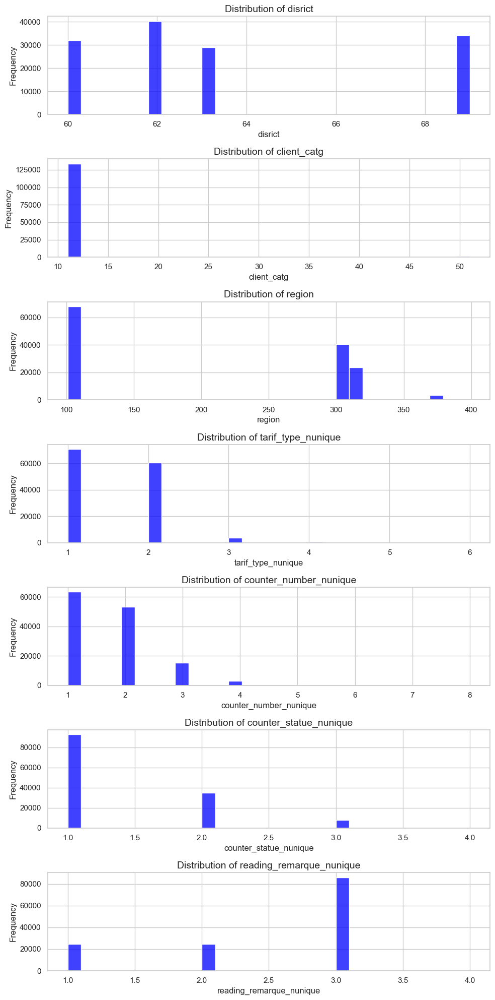

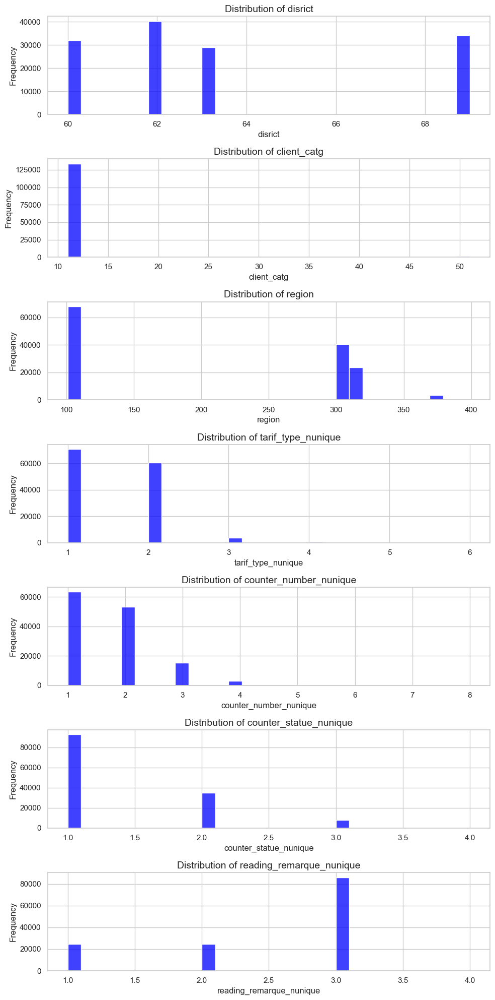

In [33]:
%matplotlib inline

# Set the style of the visualization
sns.set(style="whitegrid")

# List of columns for which we will plot the distribution
columns_to_plot = ['disrict', 'client_catg', 'region', 'tarif_type_nunique', 
                   'counter_number_nunique', 'counter_statue_nunique', 'reading_remarque_nunique']

# Create a figure and a grid of subplots
fig, axs = plt.subplots(nrows=len(columns_to_plot), figsize=(10, 20))

# Start creating the plots
for i, column in enumerate(columns_to_plot):
    sns.histplot(data[column], kde=False, ax=axs[i], bins=30, color='blue')
    axs[i].set_title(f'Distribution of {column}', fontsize=14)
    axs[i].set_ylabel('Frequency', fontsize=12)
    axs[i].set_xlabel(column, fontsize=12)

# Adjust the layout and show the plots
plt.tight_layout()
plt.show()

In [34]:
"""
The distribution plots for the selected variables provide the following insights:

District and Region: The 'disrict' and 'region' variables show that clients are heavily concentrated in certain districts and regions. 
This could be due to more commercial or residential activities in those areas, or these could be areas where the utility has a more substantial presence.

Client Category: The 'client_catg' variable indicates that the vast majority of clients fall into a single category. 
If these categories represent different types of service agreements or client types (residential, commercial, industrial, etc.), 
this might suggest that the utility's clientele is primarily of one type.

Tariff Type and Counter Number: 'tarif_type_nunique' and 'counter_number_nunique' suggest that most clients are associated with a 
single tariff type and one or two counters. Multiple tariff types or counters might be associated with more complex service setups or larger clients.

Counter Statue: The 'counter_statue_nunique' variable shows that most of the readings involve a single counter status. This might indicate that most 
counters do not have fluctuating statuses or that most are consistently in one state (e.g., working correctly).

Reading Remarque: The 'reading_remarque_nunique' distribution shows that most clients have remarks falling into one or two categories. If these remarks 
represent different observations made by agents (such as irregularities), a higher number of unique remarks might suggest more fluctuating or inconsistent service conditions.

These insights are purely based on the distribution of variables and don't directly imply fraudulent behavior. However, they help us understand the landscape of the clients' utility usage and setups.
"""

"\nThe distribution plots for the selected variables provide the following insights:\n\nDistrict and Region: The 'disrict' and 'region' variables show that clients are heavily concentrated in certain districts and regions. This could be due to more commercial or residential activities in those areas, or these could be areas where the utility has a more substantial presence.\n\nClient Category: The 'client_catg' variable indicates that the vast majority of clients fall into a single category. If these categories represent different types of service agreements or client types (residential, commercial, industrial, etc.), this might suggest that the utility's clientele is primarily of one type.\n\nTariff Type and Counter Number: 'tarif_type_nunique' and 'counter_number_nunique' suggest that most clients are associated with a single tariff type and one or two counters. Multiple tariff types or counters might be associated with more complex service setups or larger clients.\n\nCounter Statue

#### Examining the relationship between key variables and the target 'fraud' variable

In [ ]:
from scipy.stats import pointbiserialr

# Calculate point-biserial correlations with the target
correlations = {col: pointbiserialr(data[col], data['target'])[0] for col in columns_to_plot}

# Convert the results to a DataFrame for easy viewing
correlation_results = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])

# For bivariate analysis, we will plot some of the main variables against the target
# We use box plots to see the data distribution relative to each category of the target
fig, axs = plt.subplots(nrows=len(columns_to_plot), figsize=(10, 20))

for i, column in enumerate(columns_to_plot):
    sns.boxplot(x='target', y=column, data=data, ax=axs[i], showfliers=False)
    axs[i].set_title(f'Relationship between {column} and Fraud', fontsize=14)
    axs[i].set_xlabel('Fraud', fontsize=12)
    axs[i].set_ylabel(column, fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
correlation_results

In [ ]:
"""
The correlation analysis and bivariate box plots provide several insights:

Correlation with Target:

The 'counter_number_nunique' has the highest positive correlation with fraud, suggesting that clients with a higher number of unique counters are more likely to be involved in fraudulent activities. However, the 
correlation, while statistically significant, is still relatively low, indicating that this feature alone cannot be used to determine fraud.
'reading_remarque_nunique' and 'tarif_type_nunique' also have some level of positive correlation with fraud, indicating that these features might play a role in fraud cases.
Other variables like 'disrict', 'client_catg', 'region', and 'counter_statue_nunique' have very low point-biserial correlation coefficients, indicating a weaker linear relationship with the fraud status.
Bivariate Analysis:

The box plots between these variables and the target show that there is a noticeable difference in the distributions between fraudulent and non-fraudulent cases for variables like 
'counter_number_nunique', 'tarif_type_nunique', and 'reading_remarque_nunique'.
Particularly, 'counter_number_nunique' tends to be higher for fraudulent cases, which is consistent with the correlation analysis.
"""

#### Temporal analysis

In [ ]:
# Convert 'creation_date' to datetime format
data['creation_date'] = pd.to_datetime(data['creation_date'], format='%d/%m/%Y')

# Check the minimum and maximum dates to understand the timeframe
min_date, max_date = data['creation_date'].min(), data['creation_date'].max()

# Extract the year from the creation_date and create a new column 'creation_year'
data['creation_year'] = data['creation_date'].dt.year

# Group the data by 'creation_year' and calculate the mean of 'target' (fraud rate) for each year
fraud_over_time = data.groupby('creation_year')['target'].mean().reset_index()

# Plotting the trend of fraud over the years
plt.figure(figsize=(12, 6))
sns.lineplot(x='creation_year', y='target', data=fraud_over_time, marker='o')
plt.title('Trend of Fraud Over Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Fraud Rate', fontsize=14)
plt.grid(True)
plt.show()

# For the categorical analysis, we will look at the 'client_catg' and 'region' in relation to fraud
# We will calculate the fraud rate within each category
fraud_by_category = data.groupby('client_catg')['target'].mean().reset_index()
fraud_by_region = data.groupby('region')['target'].mean().reset_index()

# Now we'll visualize these relationships
fig, axs = plt.subplots(nrows=2, figsize=(15, 14))

# Fraud rate by client category
sns.barplot(x='client_catg', y='target', data=fraud_by_category, ax=axs[0], palette='viridis')
axs[0].set_title('Fraud Rate by Client Category', fontsize=16)
axs[0].set_xlabel('Client Category', fontsize=14)
axs[0].set_ylabel('Fraud Rate', fontsize=14)

# Fraud rate by region
sns.barplot(x='region', y='target', data=fraud_by_region, ax=axs[1], palette='viridis')
axs[1].set_title('Fraud Rate by Region', fontsize=16)
axs[1].set_xlabel('Region', fontsize=14)
axs[1].set_ylabel('Fraud Rate', fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
min_date, max_date

In [ ]:
"""
The temporal and categorical analyses provide several insights:

Temporal Analysis:

The dataset spans from February 5, 1977, to September 10, 2019.
The trend line of fraud over the years shows fluctuations, with certain years experiencing higher rates of fraud. There doesn't appear to be a consistent upward or downward trend, 
indicating that fraud occurrences might be influenced by various factors changing over the years. It's also important to note that the rate of fraud seems to oscillate, suggesting 
periods of higher vigilance or different operational circumstances.
Categorical Analysis:

Client Category: The fraud rate varies significantly between different client categories. Some categories have a noticeably higher rate of fraud, suggesting that these client 
types might be more prone to fraudulent activities or inconsistencies in their consumption reporting. This could also reflect different monitoring intensities or methodologies 
for different client types.
Region: Similar to client categories, certain regions experience a higher fraud rate. These areas might be subject to less stringent oversight, or they might inherently have 
more opportunities for fraud due to operational challenges.
"""